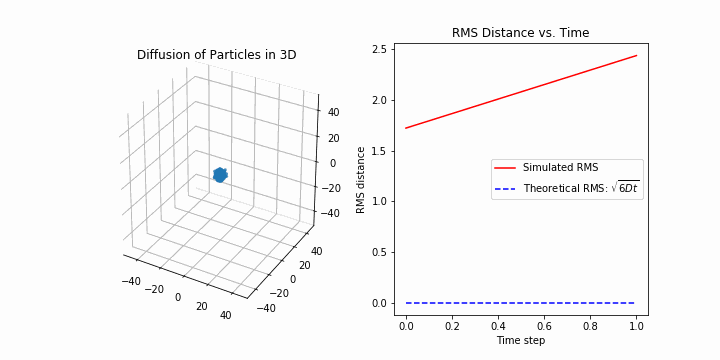

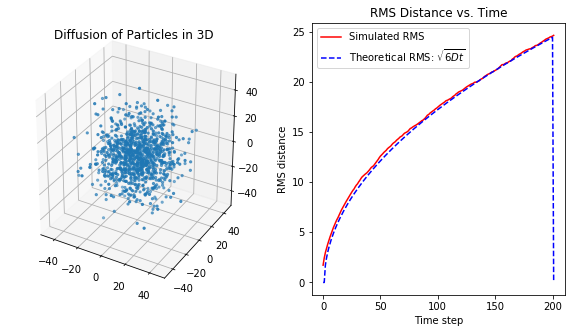

In [5]:
# Importing necessary libraries:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, Image
from mpl_toolkits.mplot3d import Axes3D

# Number of particles and steps
N = 1000
steps = 200

# Initialize particles in a sphere
phi = 2 * np.pi * np.random.rand(N)
costheta = 2 * np.random.rand(N) - 1
theta = np.arccos(costheta)
radius = 0.01  # Cube root for uniform distribution in a sphere

x = radius * np.sin(theta) * np.cos(phi)
y = radius * np.sin(theta) * np.sin(phi)
z = radius * np.cos(theta)

positions = np.column_stack((x, y, z))
rms_values = []

# Diffusion coefficient for our simulation
diffusion_coefficient = 0.5

theoretical_rms = []

# Update function for diffusion
def update(num, positions, scat, rms_values, theoretical_rms):
    # 3D Diffusion step
    steps = np.random.randn(N, 3)
    positions += steps
    
    # Update particle positions
    scat._offsets3d = positions[:, 0], positions[:, 1], positions[:, 2]
    
    # Calculate RMS distance and append to rms_values
    rms = np.sqrt(np.mean(np.sum(positions**2, axis=1)))
    rms_values.append(rms)
    
    # Calculate theoretical RMS for diffusion in 3D
    theoretical_rms.append(np.sqrt(6 * diffusion_coefficient * num))
    
    # Update RMS plot
    ax2.clear()
    ax2.plot(rms_values, 'r', label="Simulated RMS")
    ax2.plot(theoretical_rms, 'b--', label="Theoretical RMS: $\sqrt{6Dt}$")
    ax2.set_title('RMS Distance vs. Time')
    ax2.set_xlabel('Time step')
    ax2.set_ylabel('RMS distance')
    ax2.legend()
    
    return scat,

# Set up the figure and axis
fig = plt.figure(figsize=(10, 5))

# 3D scatter plot for diffusion
ax1 = fig.add_subplot(121, projection='3d')
scat = ax1.scatter(x, y, z, s=5)
ax1.set_xlim(-50, 50)
ax1.set_ylim(-50, 50)
ax1.set_zlim(-50, 50)
ax1.set_title('Diffusion of Particles in 3D')

# RMS plot
ax2 = fig.add_subplot(122)

ani = animation.FuncAnimation(fig, update, frames=steps, fargs=(positions, scat, rms_values, theoretical_rms), blit=False, repeat=False)

# Save the animation as GIF
ani.save('3d_diffusion.gif', writer='pillow')

# Display the GIF in the notebook
with open("3d_diffusion.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))
